In [1]:
from utils import set_up_logging

set_up_logging()

import torch
from training import HistogramDataset
from visualisation import display_images
from models import load_model
from config import MODELS_PATH, TEST_DATA

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
model, hyperparameters = load_model(MODELS_PATH / "run_84", device)
dataset = HistogramDataset(
    TEST_DATA,
    edit_count=hyperparameters["edit_count"],
    bin_count=hyperparameters["bin_count"],
    target_size=(640, 640),
)

2024-06-24 20:08:12,680 - INFO - Loading model from /home/andras/projects/bipolaroid/models/run_84
2024-06-24 20:08:12,681 - INFO - Hyperparameters: {'batch_size': 128, 'edit_count': 12, 'bin_count': 16, 'learning_rate': 0.0028247902494960017, 'scheduler_gamma': 0.8821350225654652, 'num_epochs': 12, 'elu_alpha': 1.45178934308029, 'leaky_relu_slope': 0.02096034064873269, 'dropout_prob': 0.07412793247307183, 'features': [8, 8, 8], 'kernel_sizes': [3, 3, 3], 'model_type': 'Residual3', 'clip_gradients': False, 'use_instance_norm': True, 'use_elu': False, 'leaky_relu_alpha': 0.008774022654169567}
2024-06-24 20:08:14,468 - INFO - Parameter count: 429457
2024-06-24 20:08:14,472 - INFO - Loaded 2498 original images


In [2]:
img_idx = 1008
img = dataset.get_original_image(img_idx)

edits = {"Original": img}
edits.update(
    {f"Edit {i}": dataset.get_edited_image(img_idx, edit_idx=i) for i in range(1, 36)}
)

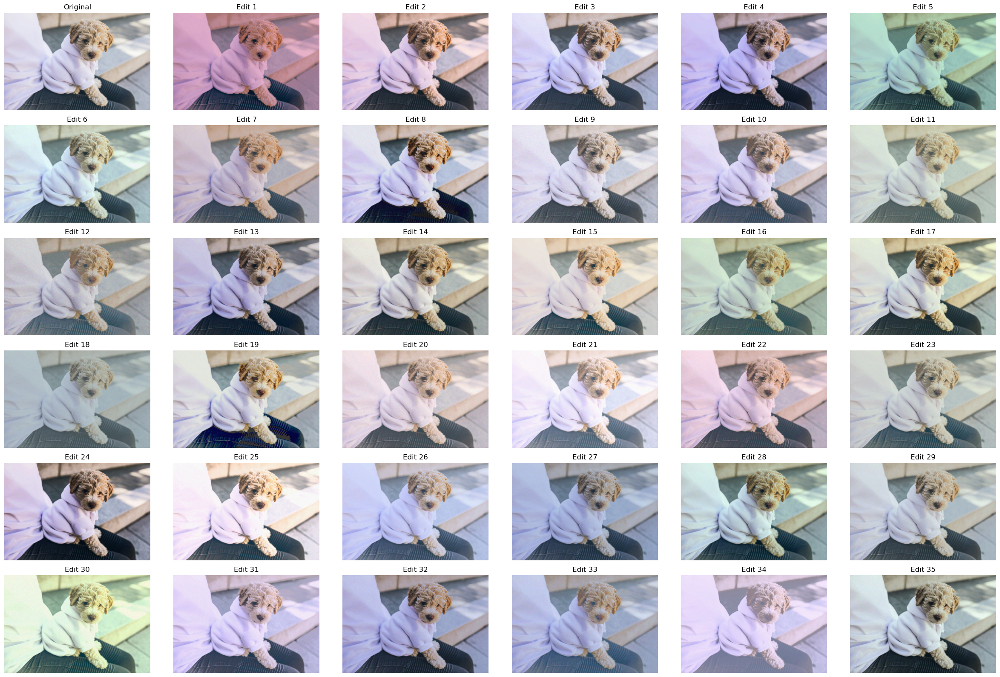

In [3]:
display_images(edits, images_per_row=6, figsize=(24, 16))

In [4]:
import numpy
from utils import compute_histogram


inputs = (
    torch.tensor(
        numpy.array(
            [
                compute_histogram(
                    image, bins=hyperparameters["bin_count"], normalize=True
                )
                for image in edits.values()
            ]
        ),
        dtype=torch.float,
    ).unsqueeze(1)
).to(device)

outputs = model(inputs)

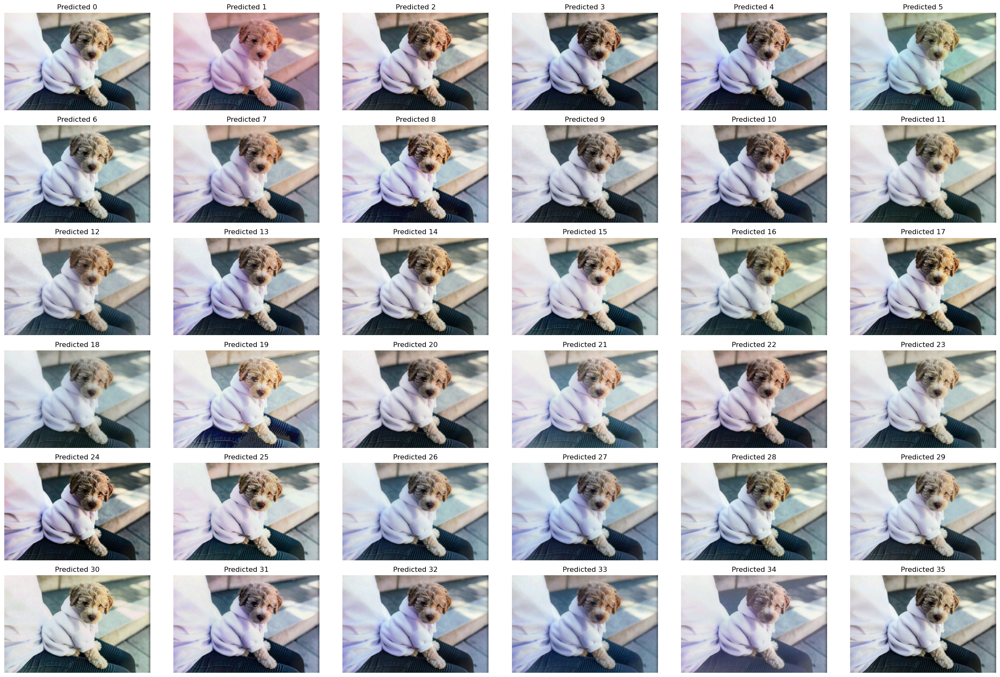

In [5]:
from histogram_transfer import apply_histogram
from PIL import Image


predicted = {
    f"Predicted {i}": Image.fromarray(
        apply_histogram(image, histogram, hyperparameters["bin_count"])
    )
    for i, (image, histogram) in enumerate(zip(edits.values(), outputs))
}
display_images(predicted, images_per_row=6, figsize=(24, 16))